# Energy Preserving Operator Inference Optimization Example using Viscous Burgers' Equation

In this notebook, we conduct the numerical experiment for the energy-preserving Operator Inference (ep-OpInf) by introducing a hard equality constraint, soft inequality constraint, or objective function penalty to the standard operators inference optimization problem. 

## Packages

In [1]:
using CSV
using DataFrames
using FileIO
using JLD2
using LaTeXStrings
using LinearAlgebra
using NaNStatistics
using Plots
theme(:dark)
using Plots.PlotMeasures
using ProgressMeter
using Random
using SparseArrays
using Statistics
using Tables
;

## Initial Setup

In [2]:
include("../src/model/Burgers.jl")
include("../src/LiftAndLearn.jl")
const LnL = LiftAndLearn
;

In [3]:
# First order Burger's equation setup
burger = Burgers(
    [0.0, 1.0], [0.0, 1.0], [0.1, 0.10],
    2^(-7), 1e-4, 1, "periodic"
)
;

In [4]:
# Create file name to save data
filename = "data/epOpInf_periodic_data.jld2"
;

### Important Parameters

In [6]:
# Minimum and maximum dimensions
rmin = 1
rmax = 10

burger_system = LnL.sys_struct(
    is_lin=true,
    is_quad=true,
)
burger_vars = LnL.vars(
    N=1,
)
burger_data = LnL.data(
    Δt=1e-4,
    DS=100,
)
burger_optim = LnL.opt_settings(
    verbose=false,
    initial_guess=false,
    max_iter=1000,
    reproject=false,
    SIGE=false,
    linear_solver="ma97",
)

options = LnL.LS_options(
    system=burger_system,
    vars=burger_vars,
    data=burger_data,
    optim=burger_optim,
)

# Downsampling rate
DS = burger_data.DS

# Down-sampled dimension of the time data
Tdim_ds = size(1:DS:burger.Tdim, 1)  # downsampled time dimension

# Number of random test inputs
num_test_ic = 50
;

### Initial Conditions

Initial condition to sinusoidal wave with three parameters: amplitude ($a$), frequency ($b$), and phase ($c$)

$$
\begin{gather*}
    x(\omega, 0) = a\sin(2\pi \lceil b \rceil \omega + c)
\end{gather*}
$$

In [17]:
# TEST 1, 2, 9 
# Parameters of the initial condition

ic_a = range(0.8, 1.2, length=5)
ic_b = [1, 2, 3]
ic_c = range(-0.25, 0.25, length=5)

ic_a_out = [0.5, 1.5]
ic_b_out = [3, 6]
ic_c_out = [-0.5, 0.5]
num_ic_params = Int(length(ic_a) * length(ic_b) * length(ic_c))

# Parameterized function for the initial condition
init_wave = (A,a,b) -> A .* sin.(2 * pi * ceil(a) * burger.x .+ b) 
;  

A combination of exponential and cosine initial condition:


$$
\begin{gather*}
    x(\omega, 0) = \exp(-a\cos^2(\pi x+b)) - c
\end{gather*}
$$

where $a, b, c$ are the three parameters to adjust.

In [6]:
# # TEST 3
# # Parameters for the initial condition
# ic_a = [2, 4, 6]
# ic_b = [-0.5, 0, 0.5]
# ic_c = [-0.25, 0, 0.25]
# ic_a_out = [0.1, 8]
# ic_b_out = [-0.8, 0.8]
# ic_c_out = [-0.5, 0.5]
# num_ic_params = Int(length(ic_a)*length(ic_b)*length(ic_c))

# # Parameterized initial condition
# init_wave = (a,b,c) -> exp.(-a * cos.(π .* burger.x .+ b).^2) .- c
# ;

A complex wave with a combination of exponential, cosine, and sine waves.

$$
\begin{gather*}
    x(\omega, 0) = \exp\left(-a\cos^2(\pi\omega+b) + \sin^2\left(4\pi\omega+\frac{\pi}{3}\right)+\cos^2(3\pi\omega) \right)+c
\end{gather*}
$$

where $a, b, c$ are the three parameters to adjust.

In [6]:
# # TEST 4, 6, 7, 8
# # Parameters for the initial condition
# ic_a = [1, 5, 9]
# ic_b = [-π/4, 0, π/4]
# ic_c = [-0.5, 0, 0.5]
# ic_a_out = [0.01, 20]
# ic_b_out = [-π/2, π/2]
# ic_c_out = [-1.0, 1.0]
# num_ic_params = Int(length(ic_a)*length(ic_b)*length(ic_c))

# # Parameterized initial condition
# init_wave = (a,b,c) -> exp.(-a * cos.(π .* burger.x .+ b).^2 .+ sin.(4*π .* burger.x .+ π/3).^2 .- cos.(3*π .* burger.x).^2) .+ c
# ;

## Generate Training Data

In [8]:
# Store values
Xtr = Vector{Matrix{Float64}}(undef, burger.Pdim)  # training state data 10x1
Rtr = Vector{Matrix{Float64}}(undef, burger.Pdim)  # training derivative data 10x1
Σr = Vector{Vector{Float64}}(undef, burger.Pdim)  # singular values 
Xtr_all = Matrix{Matrix{Float64}}(undef, burger.Pdim, num_ic_params)  # all training data 10x27
IC_train = Vector{Vector{Float64}}(undef, num_ic_params)  # all initial conditions 
Vrmax = Vector{Matrix{Float64}}(undef, burger.Pdim)  # POD basis 10x1
op_fom_tr = Vector{LnL.operators}(undef, burger.Pdim)  # FOM operators 10x1

@info "Generate the FOM system matrices and training data."
@showprogress for i in 1:length(burger.μs)
    μ = burger.μs[i]

    # Generate the FOM system matrices (ONLY DEPENDS ON μ)
    A, F = burger.generateEPmatrix(burger, μ)
    op_fom_tr[i] = LnL.operators(A=A, F=F)

    # Store the training data 
    Xall = Vector{Matrix{Float64}}(undef, num_ic_params)
    Xdotall = Vector{Matrix{Float64}}(undef, num_ic_params)
    
    # Generate the data for all combinations of the initial condition parameters
    ct = 1  # set/reset counter
    for a in ic_a, b in ic_b, c in ic_c
        if i == 1
            IC_train[ct] = init_wave(a, b, c)
        end

        states = burger.semiImplicitEuler(A, F, burger.t, IC_train[ct])
        Xtr_all[i,ct] = states
        
        tmp = states[:, 2:end]
        Xall[ct] = tmp[:, 1:DS:end]  # downsample data
        tmp = (states[:, 2:end] - states[:, 1:end-1]) / burger.Δt
        Xdotall[ct] = tmp[:, 1:DS:end]  # downsample data

        ct += 1  # increment counter
    end
    # Combine all initial condition data to form on big training data matrix
    Xtr[i] = reduce(hcat, Xall) 
    Rtr[i] = reduce(hcat, Xdotall)
    
    # Compute the POD basis from the training data
    tmp = svd(Xtr[i])
    Vrmax[i] = tmp.U[:, 1:rmax]
    Σr[i] = tmp.S
end

# Data = Dict("Xtr" => Xtr, "Rtr" => Rtr, "Vrmax" => Vrmax, 
#         "op_fom_tr" => op_fom_tr, "Σr" => Σr,
#         "Xtr_all" => Xtr_all, "IC_train" => IC_train)
# @save filename Data

┌ Info: Generate the FOM system matrices and training data.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:10


In [21]:
p1 = plot()
timestamps = 1:1000:burger.Tdim
plot!(
    p1, burger.x, Xtr_all[1,1][:, timestamps], color=:roma, line_z=(burger.Δt*timestamps)', 
    lw=1.5, label="", colorbar_ticks=0:0.1:1.0, clims=(0,1.0),
) 
plot!(p1, xlabel=L"\omega"*", spatial coordinate", ylabel=L"x(\omega,t)", grid=true, minorgrid=true)
plot!(p1, guidefontsize=16, tickfontsize=13,  legendfontsize=13, fontfamily="Computer Modern", fg_legend=false)
plot!(p1, colorbar_title=L"t", colorbar_titlefontsize=16)
plot!(p1, background_color=:transparent, background_color_inside="#44546A", dpi=600)
savefig(p1, "figures/burgers_xVSomega.png");

In [31]:
plot(contourf(burger.t, burger.x, Xtr_all[1,1], lw=0, color=:inferno), xlabel=L"t", ylim=[0, 1.0],
    ylabel=L"\omega, \mathrm{spatial~coordinate}", zlabel=L"u(x,t)", size=(1200, 800))
yticks!(0:0.2:1.0)
plot!(guidefontsize=32, tickfontsize=25,  legendfontsize=13, fontfamily="Computer Modern", right_margin=13mm, left_margin=6mm, bottom_margin=4mm, top_margin=3mm)
plot!(background_color=:transparent, background_color_inside="#44546A", dpi=600)
savefig("figures/burgers_contour.png");

### Check Energy-Levels from SVD and Decide Reduced Orders

In [132]:
nice_orders_all = Vector{Vector{Int}}(undef, burger.Pdim)
energy_level_all = Vector{Vector{Float64}}(undef, burger.Pdim)

for i in eachindex(burger.μs)
    nice_orders_all[i], energy_level_all[i] = LnL.choose_ro(Σr[i]; en_low=-12)
end
nice_orders = Int.(round.(mean(nice_orders_all)))
energy_level = mean(energy_level_all)
;

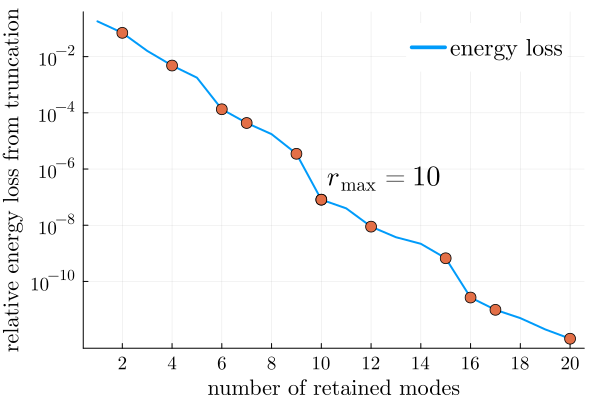

In [197]:
plot(energy_level[1:nice_orders[end]], yaxis=:log10, label="energy loss", fontfamily="Computer Modern", lw=2,
    ylabel="relative energy loss from truncation", xlabel="number of retained modes", legend=:topright, majorgrid=true, grid=true)
plot!(nice_orders, energy_level[nice_orders], seriestype=:scatter, label=nothing, markersize=6)
for i in 1:length(nice_orders)
    if i == 7
        annotate!((nice_orders[i]+2.5, energy_level[nice_orders[i]], text(L"r_{\mathrm{max}}="*string(nice_orders[i]), :bottom, 18, "Computer Modern")))
    end
end
yticks!(10.0 .^ (0:-2:-10))
xticks!(0:2:20)
plot!(fg_legend=:false)
plot!(guidefontsize=14, tickfontsize=12, titlefontsize=15,  legendfontsize=15, right_margin=2mm)
# title!("Viscous Burgers' Equation")
# savefig("figures/burgers_energy_loss.pdf");

## Generate Test Data (Inside Training Region)

50 random amplitude, frequency, and phase from the training region for $\mu \in M$.


In [58]:
# Store values
Xtest_in = Matrix{Matrix{Float64}}(undef, burger.Pdim, num_test_ic)  # all training data 
IC_test_in = Vector{Vector{Float64}}(undef, num_test_ic)  # all initial conditions

@info "Generate test data for parameters within the training region."

# Generate 10 random initial condition parameters
ic_a_rand_in = (maximum(ic_a) - minimum(ic_a)) .* rand(num_test_ic) .+ minimum(ic_a)
ic_b_rand_in = (maximum(ic_b) - minimum(ic_b)) .* rand(num_test_ic) .+ minimum(ic_b)
ic_c_rand_in = (maximum(ic_c) - minimum(ic_c)) .* rand(num_test_ic) .+ minimum(ic_c)

@showprogress for i in 1:length(burger.μs)
    μ = burger.μs[i]

    # Generate the FOM system matrices (ONLY DEPENDS ON μ)
    A = op_fom_tr[i].A
    F = op_fom_tr[i].F

    # Generate the data for all combinations of the initial condition parameters
    prog = Progress(num_test_ic)
    Threads.@threads for j in 1:num_test_ic  
        a = ic_a_rand_in[j]
        b = ic_b_rand_in[j]
        c = ic_c_rand_in[j]

        if i == 1
            IC_test_in[j] = init_wave(a, b, c)
        end
        Xtest_in[i,j] = burger.semiImplicitEuler(A, F, burger.t, IC_test_in[j])
        next!(prog)
    end
end

Data["Xtest_in"] = Xtest_in
Data["IC_test_in"] = IC_test_in
@save filename Data

┌ Info: Generate test data for parameters within the training region.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:5


Progress:   4%|██                                       |  ETA: 0:56:47

Progress:  58%|████████████████████████                 |  ETA: 0:17:47

Progress:  78%|████████████████████████████████         |  ETA: 0:09:37

Progress:  80%|█████████████████████████████████        |  ETA: 0:08:31

Progress:  84%|███████████████████████████████████      |  ETA: 0:06:30

Progress:  86%|████████████████████████████████████     |  ETA: 0:05:33

Progress:  88%|█████████████████████████████████████    |  ETA: 0:04:40

Progress:  90%|█████████████████████████████████████    |  ETA: 0:03:48

Progress:  92%|██████████████████████████████████████   |  ETA: 0:02:58

Progress:  94%|███████████████████████████████████████  |  ETA: 0:02:11

Progress:  96%|████████████████████████████████████████ |  ETA: 0:01:26

Progress:  98%|█████████████████████████████████████████|  ETA: 0:00:43

Progress: 100%|█████████████████████████████████████████| Time: 0:34:58


## Generate Test Data (Outside Training Region)

50 random amplitude, frequency, and phase outside of the training region for $\mu \in M$.



In [ ]:
# Store values
Xtest_out = Matrix{Matrix{Float64}}(undef, burger.Pdim, num_test_ic)  # all training data 
IC_test_out = Vector{Vector{Float64}}(undef, num_test_ic)  # all initial conditions

@info "Generate test data for parameters outside the training region."

# Generate 10 random initial condition parameters outside the training region
ϵ=1e-2
half_num_test_ic = Int(num_test_ic/2)
ic_a_rand_out = ((minimum(ic_a) - ϵ) - ic_a_out[1]) .* rand(half_num_test_ic) .+ ic_a_out[1]
append!(ic_a_rand_out, (ic_a_out[2] - (maximum(ic_a) + ϵ)) .* rand(half_num_test_ic) .+ (maximum(ic_a) + ϵ))
# ic_b_rand_out = ((minimum(ic_b) - ϵ) - ic_b_out[1]) .* rand(half_num_test_ic) .+ ic_b_out[1]
# append!(ic_b_rand_out, (ic_b_out[2] - (maximum(ic_b) + ϵ)) .* rand(half_num_test_ic) .+ (maximum(ic_b) + ϵ))
ic_b_rand_out = (ic_b_out[2] - ic_b_out[1] + ϵ) .* rand(num_test_ic) .+ ic_b_out[1]
ic_c_rand_out = ((minimum(ic_c) - ϵ) - ic_c_out[1]) .* rand(half_num_test_ic) .+ ic_c_out[1]
append!(ic_c_rand_out, (ic_c_out[2] - (maximum(ic_c) + ϵ)) .* rand(half_num_test_ic) .+ (maximum(ic_c) + ϵ))

@showprogress for i in 1:length(burger.μs)
    μ = burger.μs[i]

    # Generate the FOM system matrices (ONLY DEPENDS ON μ)
    A = op_fom_tr[i].A
    F = op_fom_tr[i].F

    # Generate the data for all combinations of the initial condition parameters
    prog = Progress(num_test_ic)
    Threads.@threads for j in 1:num_test_ic
        a = ic_a_rand_out[j]
        b = ic_b_rand_out[j]
        c = ic_c_rand_out[j]

        if i == 1
            IC_test_out[j] = init_wave(a, b, c)
        end
        Xtest_out[i,j] = burger.semiImplicitEuler(A, F, burger.t, IC_test_out[j])
        next!(prog)
    end
end

Data["Xtest_out"] = Xtest_out
Data["IC_test_out"] = IC_test_out
# @save filename Data

## Obtain OpInf Least-Squares Operators

In [6]:
@info "Compute the Least Squares solution."

options = LnL.LS_options(
    system=burger_system,
    vars=burger_vars,
    data=burger_data,
    optim=burger_optim,
    # pinv_tol = 1e-4,  # tolerance for pseudo-inverse
)

# Store values
op_LS = Array{LnL.operators}(undef, burger.Pdim)

# Load the data dictionary
if !(@isdefined Data)
    @info "Loading data from epOpInf_periodic_data.jld2"
    if !isfile(filename)
        error("Run the cell above to generate the data first!")
    end
    Data = load(filename)
    Xtr = Data["Xtr"]
    Rtr = Data["Rtr"]
    Vrmax = Data["Vrmax"]
    @info "Data loaded."
end

@showprogress for i in 1:length(burger.μs)
    op_LS[i] = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i], Vrmax[i]' * Rtr[i], options)
end

# Save to data
Data["op_LS"] = op_LS
save(filename, Data)

┌ Info: Compute the Least Squares solution.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:1


┌ Info: Loading data from epOpInf_periodic_data.jld2
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:16
┌ Info: Data loaded.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:24


## Obtain intrusive operators 

In [10]:
@info "Compute the intrusive model"

# Store values
op_int = Array{LnL.operators}(undef, burger.Pdim)

# Load the data dictionary
if !(@isdefined Data)
    @info "Loading data from epOpInf_periodic_data.jld2"
    if !isfile(filename)
        error("Run the cell above to generate the data first!")
    end
    Data = load(filename)
    Vrmax = Data["Vrmax"]
    op_fom_tr = Data["op_fom_tr"]
    @info "Data loaded."
end

for i in 1:length(burger.μs)
    # Compute the values for the intrusive model from the basis of the training data
    op_int[i] = LnL.intrusiveMR(op_fom_tr[i], Vrmax[i], options)
    @info "Loop $(i) out of $(burger.Pdim) completed..."
end

# Save to data
Data["op_int"] = op_int
save(filename, Data)

┌ Info: Compute the intrusive model
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:1


┌ Info: Loop 1 out of 1 completed...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:21


## Obtain operators for EPHEC-OpInf

In [11]:
@info "Compute the EPHEC model"

options = LnL.EPHEC_options(
    system=burger_system,
    vars=burger_vars,
    data=burger_data,
    optim=burger_optim,
)

# Load the data dictionary
if !(@isdefined Data)
    @info "Loading data from data file..."
    if !isfile(filename)
        error("Run the cell above to generate the data first!")
    end
    Data = load(filename)
    Xtr = Data["Xtr"]
    Rtr = Data["Rtr"]
    Vrmax = Data["Vrmax"]
    op_int = Data["op_int"]
    @info "Data loaded."
end

op_ephec = options.optim.SIGE ? Array{LnL.operators}(undef, burger.Pdim, rmax-rmin+1) : Array{LnL.operators}(undef, burger.Pdim)

for i in 1:length(burger.μs)
    if options.optim.SIGE
        options.optim.initial_guess = false  # turn off initial guess for the first iteration
        op_tmp = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i][:,1:rmin], Vrmax[i][:,1:rmin]' * Rtr[i], options)  # compute the first operator
        op_ephec[i, 1] = op_tmp  # store the first operator
        for j in rmin+1:rmax
            options.optim.initial_guess = true  # turn on initial guess for the rest of the iterations
            op_tmp = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i][:,1:j], Vrmax[i][:,1:j]' * Rtr[i], options, LnL.operators(A=op_tmp.A, F=op_tmp.F)) # compute the rest of the operators
            op_ephec[i, j] = op_tmp # store the rest of the operators
        end
    else 
        # Use Ipopt default initial guess
        options.optim.initial_guess = false 
        op_ephec[i] = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i], Vrmax[i]' * Rtr[i], options)
    end

    @info "Loop $(i) out of $(burger.Pdim) completed..."
end

# Save to data
Data["op_ephec"] = op_ephec
save(filename, Data)

┌ Info: Compute the EPHEC model
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:1


┌ Info: Initialize optimization model.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:24


┌ Info: Add constraints
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:114


┌ Info: Set objective
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:132


┌ Info: Done.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:165



******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



┌ Info: Optimize model.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:167
┌ Info: [EP-OpInf Results]
│ Constraint           = Energy-Preserving Hard Equality Constraint
│ Linear Regulation    = 0
│ Quadratic Regulation = 0
│ Warm Start           = false
│ order                = 10
│ solve time           = 4.835000038146973
│ termination_status   = LOCALLY_SOLVED
│ primal_status        = FEASIBLE_POINT
│ dual_state           = FEASIBLE_POINT
│ dual objective value = 0.12799715699874348
│ objective_value      = 0.06399857849934604
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:169
┌ Info: Done.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:189


┌ Info: Loop 1 out of 1 completed...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:42


## Obtain operators for EPSIC-OpInf

In [22]:
@info "Compute the EPSIC OpInf."

options = LnL.EPSIC_options(
    system=burger_system,
    vars=burger_vars,
    data=burger_data,
    optim=burger_optim,
    ϵ=1e-3,
)

# Load the data dictionary
if !(@isdefined Data)
    @info "Loading data from epOpInf_periodic_data.jld2"
    if !isfile(filename)
        error("Run the cell above to generate the data first!")
    end
    Data = load(filename)
    Xtr = Data["Xtr"]
    Rtr = Data["Rtr"]
    Vrmax = Data["Vrmax"]
    op_int = Data["op_int"]
    @info "Data loaded."
end

op_epsic = options.optim.SIGE ? Array{LnL.operators}(undef, burger.Pdim, rmax-rmin+1) : Array{LnL.operators}(undef, burger.Pdim)

for i in 1:length(burger.μs)
    if options.optim.SIGE
        options.optim.initial_guess = false  # turn off initial guess for the first iteration
        op_tmp = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i][:,1:rmin], Vrmax[i][:,1:rmin]' * Rtr[i], options)  # compute the first operator
        op_epsic[i, 1] = op_tmp  # store the first operator
        for j in rmin+1:rmax
            options.optim.initial_guess = true  # turn on initial guess for the rest of the iterations
            op_tmp = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i][:,1:j], Vrmax[i][:,1:j]' * Rtr[i], options, LnL.operators(A=op_tmp.A, F=op_tmp.F)) # compute the rest of the operators
            op_epsic[i, j] = op_tmp # store the rest of the operators
        end
    else 
        # Use Ipopt default initial guess
        options.optim.initial_guess = false 
        op_epsic[i] = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i], Vrmax[i]' * Rtr[i], options)
    end

    @info "Loop $(i) out of $(burger.Pdim) completed..."
end

# Save to data
Data["op_epsic"] = op_epsic
save(filename, Data)

┌ Info: Compute the EPSIC OpInf.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:1


┌ Info: Initialize optimization model.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:217
┌ Info: Set objective
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:318


┌ Info: Add constraints
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:345
┌ Info: Done.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:380


┌ Info: Optimize model.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:382
┌ Info: [EP-OpInf Results]
│ Constraint           = Energy-Preserving Soft Inequality Constraint
│ Linear Regulation    = 0
│ Quadratic Regulation = 0
│ Warm Start           = false
│ order                = 15
│ solve time           = 177.05599999427795
│ termination_status   = LOCALLY_SOLVED
│ primal_status        = FEASIBLE_POINT
│ dual_state           = FEASIBLE_POINT
│ dual objective value = 0.028452874657914264
│ objective_value      = 0.014228125624268107
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:384
┌ Info: Done.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:404
┌ Info: Loop 1 out of 1 completed...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:43


## Obtain operators for EPP-OpInf

In [23]:
@info "Compute the EPUC OpInf."

options = LnL.EPP_options(
    system=burger_system,
    vars=burger_vars,
    data=burger_data,
    optim=burger_optim,
    α=1e6,
)

# Load the data dictionary
if !(@isdefined Data)
    @info "Loading data from epOpInf_periodic_data.jld2"
    if !isfile(filename)
        error("Run the cell above to generate the data first!")
    end
    Data = load(filename)
    # op_guess = test==3 ? Data["op_rand"] : nothing
    Xtr = Data["Xtr"]
    Rtr = Data["Rtr"]
    Vrmax = Data["Vrmax"]
    op_int = Data["op_int"]
    @info "Data loaded."
end

op_epp = options.optim.SIGE ? Array{LnL.operators}(undef, burger.Pdim, rmax-rmin+1) : Array{LnL.operators}(undef, burger.Pdim)

for i in 1:length(burger.μs)
    if options.optim.SIGE
        options.optim.initial_guess = false  # turn off initial guess for the first iteration
        op_tmp = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i][:,1:rmin], Vrmax[i][:,1:rmin]' * Rtr[i], options)  # compute the first operator
        op_epp[i, 1] = op_tmp  # store the first operator
        for j in rmin+1:rmax
            options.optim.initial_guess = true  # turn on initial guess for the rest of the iterations
            op_tmp = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i][:,1:j], Vrmax[i][:,1:j]' * Rtr[i], options, LnL.operators(A=op_tmp.A, F=op_tmp.F)) # compute the rest of the operators
            op_epp[i, j] = op_tmp # store the rest of the operators
        end
    else 
        # Use Ipopt default initial guess
        options.optim.initial_guess = false 
        op_epp[i] = LnL.inferOp(Xtr[i], zeros(Tdim_ds,1), zeros(Tdim_ds,1), Vrmax[i], Vrmax[i]' * Rtr[i], options)
    end

    @info "Loop $(i) out of $(burger.Pdim) completed..."
end

# Save to data
Data["op_epp"] = op_epp
save(filename, Data)

┌ Info: Compute the EPUC OpInf.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:1


┌ Info: Initialize optimization model.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:432
┌ Info: Set penalty
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:534


┌ Info: Set objective
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:548
┌ Info: Done.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:581
┌ Info: Optimize model.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:583


┌ Info: [EP-OpInf Results]
│ Constraint           = Energy-Preserving Unconstrained
│ EP Weight            = 1.0e6
│ Linear Regulation    = 0
│ Quadratic Regulation = 0
│ Warm Start           = false
│ order                = 15
│ solve time           = 324.76799988746643
│ termination_status   = ALMOST_LOCALLY_SOLVED
│ primal_status        = NEARLY_FEASIBLE_POINT
│ dual_state           = NEARLY_FEASIBLE_POINT
│ dual objective value = 0.050443129336456186
│ objective_value      = 0.025202274322509766
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:585
┌ Info: Done.
└ @ Main.LiftAndLearn c:\Users\tkoike3\Code\LiftAndLearn.jl\src\optimizer\EP_Optimize.jl:606


┌ Info: Loop 1 out of 1 completed...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:44


## Analyze Training Results

### Function

In [12]:
function EP_analyze(Data,burger,options,X_all,IC,rmin,rmax; is_train=true)

    # Projection error
    PE_all = zeros(rmax - (rmin-1), burger.Pdim) 
    # Relative state error
    SE_all = Dict(
        :int => zeros(rmax-rmin+1, burger.Pdim),
        :LS => zeros(rmax-rmin+1, burger.Pdim),
        :ephec => zeros(rmax-rmin+1, burger.Pdim),
        # :epsic => zeros(rmax-rmin+1, burger.Pdim),
        # :epp => zeros(rmax-rmin+1, burger.Pdim),
    )
    # Energy 
    EN_all = Dict(
        :int => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        :LS => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        :ephec => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epsic => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epp => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        :fom => Vector{VecOrMat{Float64}}(undef, burger.Pdim)
    )
    # Constraint Residual
    CR_all = Dict(
        :int => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        :LS => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        :ephec => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epsic => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epp => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        :fom => Vector{Float64}(undef, burger.Pdim)
    )
    # Momentum
    MMT_all = Dict(
        :int => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        :LS => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        :ephec => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epsic => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epp => Matrix{Float64}(undef, rmax - (rmin - 1), burger.Pdim),
        :fom => Vector{Float64}(undef, burger.Pdim)
    )
    # Constraint Violation
    CV_all = Dict(
        :int => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        :LS => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        :ephec => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epsic => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        # :epp => Matrix{VecOrMat{Float64}}(undef, rmax - (rmin - 1), burger.Pdim),
        :fom => Vector{VecOrMat{Float64}}(undef, burger.Pdim)
    )

    # Load values
    op_LS = Data["op_LS"]
    op_int = Data["op_int"]
    op_ephec = Data["op_ephec"]
    # op_epsic = Data["op_epsic"]
    # op_epp = Data["op_epp"]
    Vrmax = Data["Vrmax"]

    num_ic_params = length(IC)

    @info "Analyze the operators with training data..."
    prog = Progress(burger.Pdim)
    for i in 1:length(burger.μs)

        # Energy, constraint residual, and constraint violation of the FOM
        EN_all[:fom][i] = norm.(eachcol(X_all[i]), 2)
        F_full = Data["op_fom_tr"][i].F
        CR_all[:fom][i], MMT_all[:fom][i] = LnL.constraintResidual(F_full, size(F_full, 1), options.optim.which_quad_term; with_mmt=true)
        CV_all[:fom][i] = LnL.constraintViolation(X_all[i], F_full, options.optim.which_quad_term)
        
        Threads.@threads for (j,r) in collect(enumerate(rmin:rmax))
            Vr = Vrmax[i][:, 1:r]

            # Temporary data storage
            PE = Array{Float64}(undef, num_ic_params)  # projection error
            SE = Dict(
                :int => Array{Float64}(undef, num_ic_params),
                :LS => Array{Float64}(undef, num_ic_params),
                :ephec => Array{Float64}(undef, num_ic_params),
                # :epsic => Array{Float64}(undef, num_ic_params),
                # :epp => Array{Float64}(undef, num_ic_params),
            )
            # En = Dict(
            #     :int => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     :LS => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     :ephec => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     # :epsic => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     # :epp => Array{Float64}(undef, num_ic_params, burger.Tdim),
            # )
            CR = Dict(
                :int => Array{Float64}(undef, num_ic_params),
                :LS => Array{Float64}(undef, num_ic_params),
                :ephec => Array{Float64}(undef, num_ic_params),
                # :epsic => Array{Float64}(undef, num_ic_params),
                # :epp => Array{Float64}(undef, num_ic_params),
            )
            mmt = Dict(
                :int => Array{Float64}(undef, num_ic_params),
                :LS => Array{Float64}(undef, num_ic_params),
                :ephec => Array{Float64}(undef, num_ic_params),
                # :epsic => Array{Float64}(undef, num_ic_params),
                # :epp => Array{Float64}(undef, num_ic_params),
            )
            # CV = Dict(
            #     :int => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     :LS => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     :ephec => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     # :epsic => Array{Float64}(undef, num_ic_params, burger.Tdim),
            #     # :epp => Array{Float64}(undef, num_ic_params, burger.Tdim),
            # )

            for (ct, ic) in enumerate(IC)

                # Integrate the LS operator inference model
                Finf_extract_LS = LnL.extractF(op_LS[i].F, r)
                Xinf_LS = burger.semiImplicitEuler(op_LS[i].A[1:r, 1:r], Finf_extract_LS, burger.t, Vr' * ic)

                @assert !any(isnan, Xinf_LS) "NaNs in Xinf_LS!"

                # Integrate the intrusive model
                Fint_extract = LnL.extractF(op_int[i].F, r)
                Xint = burger.semiImplicitEuler(op_int[i].A[1:r, 1:r], Fint_extract, burger.t, Vr' * ic)
                
                if options.optim.SIGE
                    # Integrate the energy-preserving hard equality constraint operator inference model
                    Finf_extract_ephec = op_ephec[i,j].F
                    Xinf_ephec = burger.semiImplicitEuler(op_ephec[i,j].A, op_ephec[i,j].F, burger.t, Vr' * ic)
                    # Finf_extract_ephec = LnL.extractF(op_ephec[i,rmax].F, r)
                    # Xinf_ephec = burger.semiImplicitEuler(op_ephec[i,rmax].A[1:r, 1:r], Finf_extract_ephec, burger.t, Vr' * ic)
                    
                    # # Integrate the energy-preserving soft inequality constraint operator inference model
                    # Finf_extract_epsic = op_epsic[i,j].F
                    # Xinf_epsic = burger.semiImplicitEuler(op_epsic[i,j].A, op_epsic[i,j].F, burger.t, Vr' * ic)
                    # # Finf_extract_epsic = LnL.extractF(op_epsic[i,rmax].F, r)
                    # # Xinf_epsic = burger.semiImplicitEuler(op_epsic[i,rmax].A[1:r, 1:r], Finf_extract_epsic, burger.t, Vr' * ic)

                    # # Integrate the energy-preserving unconstrained operator inference model
                    # Finf_extract_epp = op_epp[i,j].F
                    # Xinf_epp = burger.semiImplicitEuler(op_epp[i,j].A, op_epp[i,j].F, burger.t, Vr' * ic)
                    # # Finf_extract_epuc = LnL.extractF(op_epuc[i,rmax].F, r)
                    # # Xinf_epuc = burger.semiImplicitEuler(op_epuc[i,rmax].A[1:r, 1:r], Finf_extract_epuc, burger.t, Vr' * ic)
                else
                    # Integrate the energy-preserving hard equality constraint operator inference model
                    Finf_extract_ephec = LnL.extractF(op_ephec[i].F, r)
                    Xinf_ephec = burger.semiImplicitEuler(op_ephec[i].A[1:r, 1:r], Finf_extract_ephec, burger.t, Vr' * ic)
                    
                    # # Integrate the energy-preserving soft inequality constraint operator inference model
                    # Finf_extract_epsic = LnL.extractF(op_epsic[i].F, r)
                    # Xinf_epsic = burger.semiImplicitEuler(op_epsic[i].A[1:r, 1:r], Finf_extract_epsic, burger.t, Vr' * ic)

                    # # Integrate the energy-preserving unconstrained operator inference model
                    # Finf_extract_epp = LnL.extractF(op_epp[i].F, r)
                    # Xinf_epp = burger.semiImplicitEuler(op_epp[i].A[1:r, 1:r], Finf_extract_epp, burger.t, Vr' * ic)
                end

                # Compute the projection error
                PE[ct] = LnL.compProjError(X_all[i,ct], Vr)

                # Compute the relative state error
                SE[:LS][ct] = LnL.compStateError(X_all[i,ct][:, 1:DS:end], Xinf_LS[:, 1:DS:end], Vr)
                SE[:int][ct] = LnL.compStateError(X_all[i,ct][:, 1:DS:end], Xint[:, 1:DS:end], Vr)
                SE[:ephec][ct] = LnL.compStateError(X_all[i,ct][:, 1:DS:end], Xinf_ephec[:, 1:DS:end], Vr)
                # SE[:epsic][ct] = LnL.compStateError(X_all[i,ct][:, 1:DS:end], Xinf_epsic[:, 1:DS:end], Vr)
                # SE[:epp][ct] = LnL.compStateError(X_all[i,ct][:, 1:DS:end], Xinf_epp[:, 1:DS:end], Vr)

                # Compute the energy
                # En[:LS][ct, :] .= norm.(eachcol(Vr * Xinf_LS), 2)
                # En[:int][ct, :] .= norm.(eachcol(Vr * Xint), 2)
                # En[:ephec][ct, :] .= norm.(eachcol(Vr * Xinf_ephec), 2)
                # En[:epsic][ct, :] .= norm.(eachcol(Vr * Xinf_epsic), 2)
                # En[:epp][ct, :] .= norm.(eachcol(Vr * Xinf_epp), 2)

                # Compute the constraint residual and momentum
                CR[:LS][ct], mmt[:LS][ct] =  LnL.constraintResidual(Finf_extract_LS, r, options.optim.which_quad_term; with_mmt=true)
                CR[:int][ct], mmt[:int][ct] = LnL.constraintResidual(Fint_extract, r, options.optim.which_quad_term; with_mmt=true)
                CR[:ephec][ct], mmt[:ephec][ct] = LnL.constraintResidual(Finf_extract_ephec, r, options.optim.which_quad_term; with_mmt=true)
                # CR[:epsic][ct], mmt[:epsic][ct] = LnL.constraintResidual(Finf_extract_epsic, r, options.optim.which_quad_term; with_mmt=true)
                # CR[:epp][ct], mmt[:epp][ct] = LnL.constraintResidual(Finf_extract_epp, r, options.optim.which_quad_term; with_mmt=true)

                # Compute the constraint violation
                # CV[:LS][ct, :] .= LnL.constraintViolation(Xinf_LS, Finf_extract_LS, options.optim.which_quad_term)
                # CV[:int][ct, :] .= LnL.constraintViolation(Xint, Fint_extract, options.optim.which_quad_term)
                # CV[:ephec][ct, :] .= LnL.constraintViolation(Xinf_ephec, Finf_extract_ephec, options.optim.which_quad_term)
                # CV[:epsic][ct, :] .= LnL.constraintViolation(Xinf_epsic, Finf_extract_epsic, options.optim.which_quad_term)
                # CV[:epp][ct, :] .= LnL.constraintViolation(Xinf_epp, Finf_extract_epp, options.optim.which_quad_term)
            end

            # Compute errors
            PE_all[j, i] = mean(PE)
            SE_all[:LS][j, i] = mean(SE[:LS])
            SE_all[:int][j, i] = mean(SE[:int])
            SE_all[:ephec][j, i] = mean(SE[:ephec])
            # SE_all[:epsic][j, i] = mean(SE[:epsic])
            # SE_all[:epp][j, i] = mean(SE[:epp])
            
            # Compute energy 
            # EN_all[:LS][j, i] = mean(En[:LS], dims=1)
            # EN_all[:int][j, i] = mean(En[:int], dims=1)
            # EN_all[:ephec][j, i] = mean(En[:ephec], dims=1)
            # EN_all[:epsic][j, i] = mean(En[:epsic], dims=1)
            # EN_all[:epp][j, i] = mean(En[:epp], dims=1)
            
            # Compute the CR and momentum
            CR_all[:LS][j, i] = mean(CR[:LS])
            CR_all[:int][j, i] = mean(CR[:int])
            CR_all[:ephec][j, i] = mean(CR[:ephec])
            # CR_all[:epsic][j, i] = mean(CR[:epsic])
            # CR_all[:epp][j, i] = mean(CR[:epp])

            # MMT_all[:LS][j, i] = mean(mmt[:LS])
            # MMT_all[:int][j, i] = mean(mmt[:int])
            # MMT_all[:ephec][j, i] = mean(mmt[:ephec])
            # MMT_all[:epsic][j, i] = mean(mmt[:epsic])
            # MMT_all[:epp][j, i] = mean(mmt[:epp])

            # Compute constraint violations
            # CV_all[:LS][j, i] = mean(CV[:LS], dims=1)
            # CV_all[:int][j, i] = mean(CV[:int], dims=1)
            # CV_all[:ephec][j, i] = mean(CV[:ephec], dims=1)
            # CV_all[:epsic][j, i] = mean(CV[:epsic], dims=1)
            # CV_all[:epp][j, i] = mean(CV[:epp], dims=1)
        end
        next!(prog)
    end

    if is_train
        Data = Dict{String, Any}(Data)  # convert types to avoid errors
        Data["train_proj_err"] = PE_all
        Data["train_state_err"] = SE_all
        Data["train_En"] = EN_all
        Data["train_CR"] = CR_all
        Data["train_mmt"] = MMT_all
        Data["train_CV"] = CV_all
        return Data
    else
        return SE_all, EN_all
    end
end
;

In [13]:
Data = EP_analyze(Data,burger,options,Data["Xtr_all"],Data["IC_train"],rmin,rmax)
;

┌ Info: Analyze the operators with training data...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:60


### Results

In [5]:
# Load the data dictionary
if !(@isdefined Data)
    @info "Loading data from epOpInf_periodic_data.jld2"
    if !isfile(filename)
        error("Run the cell above to generate the data first!")
    end
    Data = load(filename)
    @info "Data loaded."
end
;

┌ Info: Loading data from epOpInf_periodic_data.jld2
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:3


┌ Info: Data loaded.
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:8


#### Projection Error

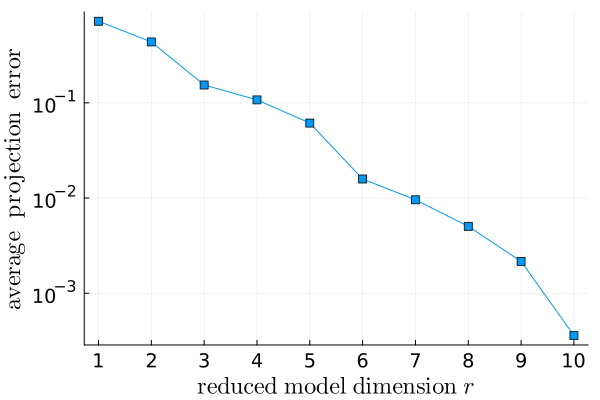

In [14]:
# Training data
mean_train_proj_err = mean(Data["train_proj_err"], dims=2)
plot(rmin:rmax, mean_train_proj_err, marker=(:rect))
plot!(yscale=:log10, majorgrid=true, legend=false)
tmp = log10.(mean_train_proj_err)
yticks!([10.0^i for i in floor(minimum(tmp))-1:ceil(maximum(tmp))+1])
xticks!(rmin:rmax)
xlabel!(L"\mathrm{reduced~model~dimension~} r")
ylabel!(L"\mathrm{average~~projection~~error}")
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13)

#### Mean relative state error

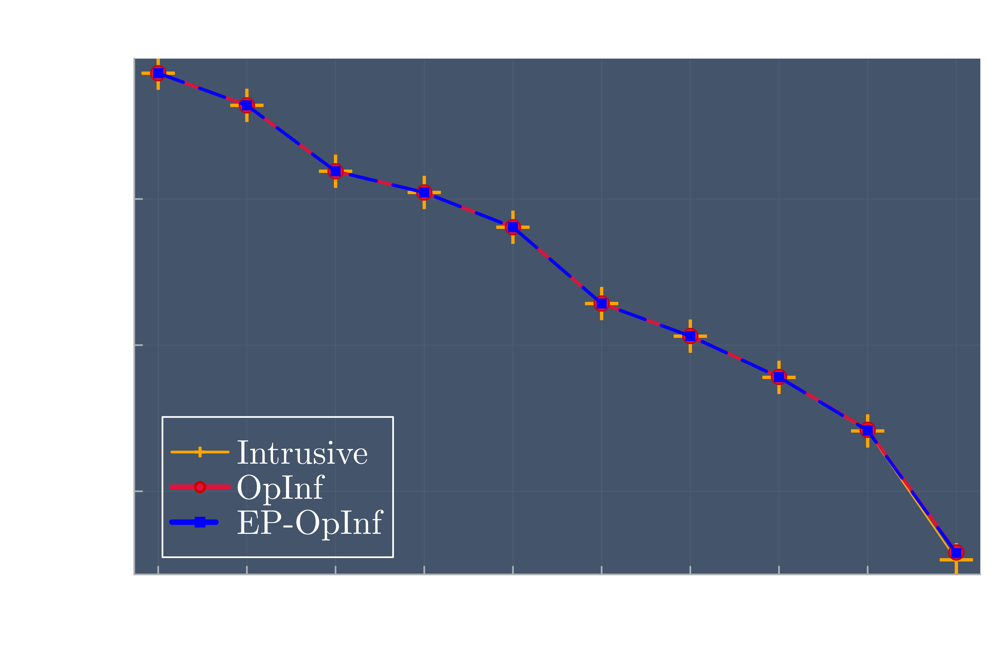

In [38]:
# Training data
mean_LS_state_err = mean(Data["train_state_err"][:LS], dims=2)
mean_int_state_err = mean(Data["train_state_err"][:int], dims=2)
mean_ephec_state_err = mean(Data["train_state_err"][:ephec], dims=2)
# mean_epsic_state_err = mean(Data["train_state_err"][:epsic], dims=2)  
# mean_epp_state_err = mean(Data["train_state_err"][:epp], dims=2)

plot(rmin:rmax, mean_int_state_err, c=:orange, marker=(:cross, 10, :orange), markerstrokewidth=2.5, label="Intrusive")
plot!(rmin:rmax, mean_LS_state_err, c=:crimson, marker=(:circle, 5, :crimson), label="OpInf", markerstrokecolor=:red3, lw=2)
plot!(rmin:rmax, mean_ephec_state_err, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), ls=:dash, lw=2, label="EP-OpInf")
# plot!(rmin:rmax, mean_epsic_state_err, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epp_state_err, c=:red, markerstrokecolor=:red, marker=(:star, 4), lw=1, ls=:dash, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(yscale=:log10, majorgrid=true, legend=:bottomleft)
tmp = log10.(mean_int_state_err)
yticks!([10.0^i for i in floor(minimum(tmp))-1:ceil(maximum(tmp))+1])
xticks!(rmin:rmax)
xlabel!("reduced model dimension " *L"r")
ylabel!("average relative state error")
title!("Training")
# ylims!(1e-4,2)
plot!(guidefontsize=16, tickfontsize=13, legendfontsize=13, titlefontsize=18, fontfamily="Computer Modern")
plot!(background_color=:transparent, background_color_inside="#44546A", dpi=600)
# savefig("figures/burgers_train_rse.png")

#### Total Energy

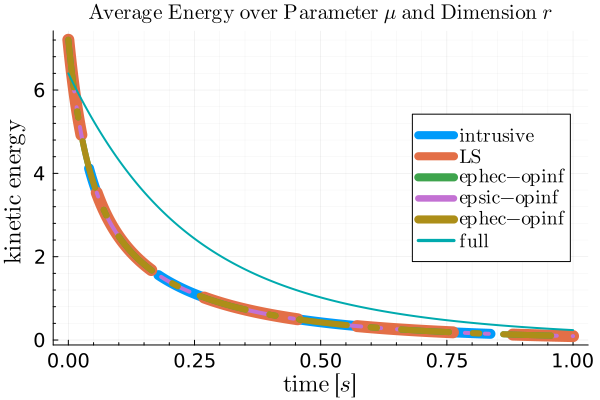

In [16]:
# Training data
mean_LS_En_tr = mean(Data["train_En"][:LS])'
mean_int_En_tr = mean(Data["train_En"][:int])'
mean_ephec_En_tr = mean(Data["train_En"][:ephec])'
mean_epsic_En_tr = mean(Data["train_En"][:epsic])'
mean_epp_En_tr = mean(Data["train_En"][:epp])'
mean_fom_En_tr = mean(Data["train_En"][:fom])

plot(burger.t, mean_int_En_tr, lw=10, ls=:dash, label=L"\mathrm{intrusive}")
plot!(burger.t, mean_LS_En_tr, lw=12, ls=:dash, label=L"\mathrm{LS}")
plot!(burger.t, mean_ephec_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epsic_En_tr, lw=4, ls=:dashdotdot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epp_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_fom_En_tr, lw=2, label=L"\mathrm{full}")
plot!(majorgrid=true, minorgrid=true, legend=:right)
xlabel!(L"\mathrm{time}~[s]")
ylabel!(L"\mathrm{kinetic~energy~}")
title!(L"\mathrm{Average~Energy~over~Parameter}~\mu \mathrm{~and~Dimension~} r")
plot!(guidefontsize=16, tickfontsize=13, legendfontsize=13)

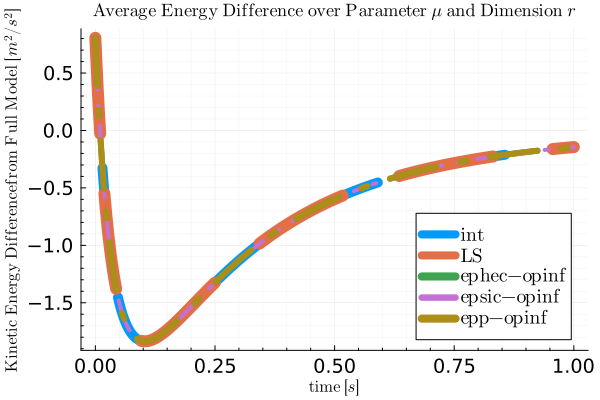

In [17]:
plot(burger.t, mean_int_En_tr - mean_fom_En_tr, lw=10, ls=:dash, label=L"\mathrm{int}")
plot!(burger.t, mean_LS_En_tr - mean_fom_En_tr, lw=12, ls=:dash, label=L"\mathrm{LS}")
plot!(burger.t, mean_ephec_En_tr - mean_fom_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epsic_En_tr - mean_fom_En_tr, lw=4, ls=:dashdotdot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epp_En_tr - mean_fom_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(majorgrid=true, minorgrid=true, legend=:bottomright)
xlabel!(L"\mathrm{time}~[s]")
ylabel!(L"\mathrm{Kinetic~Energy~Difference} \mathrm{from~Full~Model}~[m^2/s^2]", fontsize=(8))
title!(L"\mathrm{Average~Energy~Difference~over~Parameter}~\mu \mathrm{~and~Dimension~} r", titlefont = font(12))
plot!(guidefontsize=11, tickfontsize=13,  legendfontsize=13)

#### Constraint Residual 

In [40]:
mean_LS_CR_tr = mean(Data["train_CR"][:LS], dims=2)
mean_int_CR_tr = mean(Data["train_CR"][:int], dims=2)
mean_ephec_CR_tr = mean(Data["train_CR"][:ephec], dims=2)
# mean_epsic_CR_tr = mean(Data["train_CR"][:epsic], dims=2)
# mean_epp_CR_tr = mean(Data["train_CR"][:epp], dims=2)
# mean_fom_CR_tr = mean(Data["train_CR"][:fom])

plot(rmin:rmax, mean_int_CR_tr, c=:orange, marker=(:cross, 10), markerstrokewidth=2.5, label="Intrusive")
plot!(rmin:rmax, mean_LS_CR_tr, marker=(:circle, 5), c=:crimson, label="OpInf", markerstrokecolor=:crimson, lw=2)
plot!(rmin:rmax, mean_ephec_CR_tr, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), lw=2, ls=:dash, label="EP-OpInf")
# plot!(rmin:rmax, mean_epsic_CR_tr, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epp_CR_tr, c=:red, markerstrokecolor=:red, marker=(:star, 4), ls=:dash, lw=1, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(yscale=:log10, majorgrid=true, legend=:bottomright, minorgridalpha=0.03)
yticks!(10.0 .^ [-30, -25, -20, -15, -10, -5, 0])
xticks!(1:15)
xlabel!("reduced model dimension " * L"r")
ylabel!("energy-preserving constraint violation")
plot!(xlabelfontsize=15, ylabelfontsize=13, tickfontsize=13,  legendfontsize=13, fontfamily="Computer Modern")
plot!(background_color=:transparent, background_color_inside="#44546A", dpi=600)
savefig("figures/burgers_train_cv.png")

"c:\\Users\\tkoike3\\Code\\LiftAndLearn.jl\\examples\\figures\\burgers_train_cv.png"

#### Momentum 

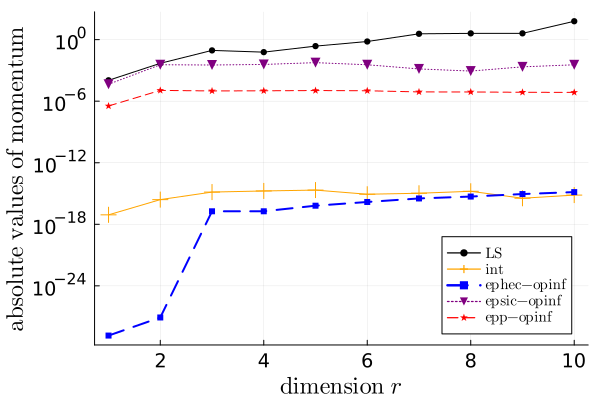

In [19]:
mean_LS_mmt_tr    = abs.(mean(Data["train_mmt"][:LS], dims=2))
mean_int_mmt_tr   = abs.(mean(Data["train_mmt"][:int], dims=2))
mean_ephec_mmt_tr = abs.(mean(Data["train_mmt"][:ephec], dims=2))
mean_epsic_mmt_tr = abs.(mean(Data["train_mmt"][:epsic], dims=2))
mean_epp_mmt_tr = abs.(mean(Data["train_mmt"][:epp], dims=2))
mean_fom_mmt_tr   = abs.(mean(Data["train_mmt"][:fom]))

plot(rmin:rmax, mean_LS_mmt_tr, marker=(:circle, 3.5), c=:black, label=L"\mathrm{LS}")
plot!(rmin:rmax, mean_int_mmt_tr, c=:orange, marker=(:cross, 8), label=L"\mathrm{int}")
plot!(rmin:rmax, mean_ephec_mmt_tr, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), lw=2, ls=:dash, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(rmin:rmax, mean_epsic_mmt_tr, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
plot!(rmin:rmax, mean_epp_mmt_tr, c=:red, markerstrokecolor=:red, marker=(:star, 4), ls=:dash, lw=1, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(yscale=:log10, majorgrid=true, legend=:bottomright, minorgridalpha=0.03)
yticks!(10.0 .^ [-30, -24, -18, -12, -6, 0, 6])
xlabel!(L"\mathrm{dimension}~r")
ylabel!(L"\mathrm{absolute~values~of~momentum}")
plot!(guidefontsize=16, tickfontsize=13, legendfontsize=10)

#### Constraint Violation

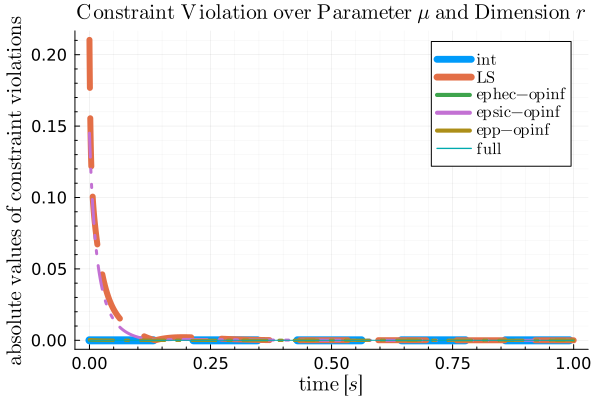

In [18]:
# Training data
mean_LS_CV_tr    = abs.(mean(Data["train_CV"][:LS]))'
mean_int_CV_tr   = abs.(mean(Data["train_CV"][:int]))'
mean_ephec_CV_tr = abs.(mean(Data["train_CV"][:ephec]))'
mean_epsic_CV_tr = abs.(mean(Data["train_CV"][:epsic]))'
mean_epp_CV_tr = abs.(mean(Data["train_CV"][:epp]))'
mean_fom_CV_tr   = abs.(mean(Data["train_CV"][:fom]))

plot(burger.t, mean_int_CV_tr, lw=8, ls=:dash, label=L"\mathrm{int}")
plot!(burger.t, mean_LS_CV_tr, lw=6, ls=:dash, label=L"\mathrm{LS}")
plot!(burger.t, mean_ephec_CV_tr, lw=3, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epsic_CV_tr, lw=3, ls=:dashdotdot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epp_CV_tr, lw=3, ls=:dashdot, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_fom_CV_tr, lw=1, label=L"\mathrm{full}")
plot!(majorgrid=true, minorgrid=true, legend=:topright)
# yticks!(10.0 .^ [-24, -21, -18, -15, -12, -9, -6, -3, 0])
title!(L"\mathrm{Constraint~Violation~over~Parameter}~\mu \mathrm{~and~Dimension~} r")
xlabel!(L"\mathrm{time}~[s]")
ylabel!(L"\mathrm{absolute~values~of~constraint~violations}")
plot!(guidefontsize=14, tickfontsize=11,  legendfontsize=11)

## Test 1: Inside Training Region

In [68]:
# Load the data dictionary
foo, bar = EP_analyze(Data,burger,options,Data["Xtest_in"],Data["IC_test_in"],rmin,rmax; is_train=false)
Data["test1_state_err"] = foo
Data["test1_En"] = bar
;

┌ Info: Analyze the operators with training data...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:60


### Results

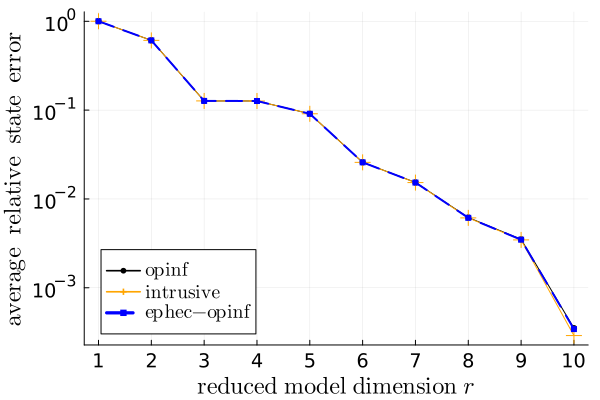

In [69]:
c1,c2,c3,c4,c5 = palette(:default)
mean_LS_state_err = mean(Data["test1_state_err"][:LS], dims=2)
mean_int_state_err = mean(Data["test1_state_err"][:int], dims=2)
mean_ephec_state_err = mean(Data["test1_state_err"][:ephec], dims=2)
# mean_epsic_state_err = mean(Data["test1_state_err"][:epsic], dims=2)
# mean_epp_state_err = mean(Data["test1_state_err"][:epp], dims=2)

plot(rmin:rmax, mean_LS_state_err, c=:black, marker=(:circle, 3.5), label=L"\mathrm{opinf}")
plot!(rmin:rmax, mean_int_state_err, c=:orange, marker=(:cross, 8), label=L"\mathrm{intrusive}")
plot!(rmin:rmax, mean_ephec_state_err, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), ls=:dash, lw=2, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epsic_state_err, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epp_state_err, c=:red, markerstrokecolor=:red, marker=(:star, 4), lw=1, ls=:dash, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(yscale=:log10, majorgrid=true, legend=:bottomleft)
tmp = log10.(mean_int_state_err)
yticks!([10.0^i for i in floor(minimum(tmp))-1:ceil(maximum(tmp))+1])
xticks!(rmin:rmax)
xlabel!(L"\mathrm{reduced~model~dimension~} r")
ylabel!(L"\mathrm{average~~relative~~state~~error}")
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13)

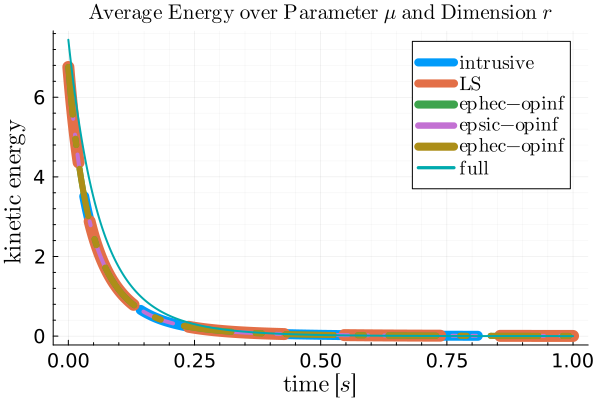

In [21]:
mean_LS_En_tr = mean(Data["test1_En"][:LS])'
mean_int_En_tr = mean(Data["test1_En"][:int])'
mean_ephec_En_tr = mean(Data["test1_En"][:ephec])'
mean_epsic_En_tr = mean(Data["test1_En"][:epsic])'
mean_epp_En_tr = mean(Data["test1_En"][:epp])'
mean_fom_En_tr = mean(Data["test1_En"][:fom])

plot(burger.t, mean_int_En_tr, lw=10, ls=:dash, label=L"\mathrm{intrusive}")
plot!(burger.t, mean_LS_En_tr, lw=12, ls=:dash, label=L"\mathrm{LS}")
plot!(burger.t, mean_ephec_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epsic_En_tr, lw=4, ls=:dashdotdot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epp_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_fom_En_tr, lw=2, label=L"\mathrm{full}")
plot!(majorgrid=true, minorgrid=true, legend=:topright)
xlabel!(L"\mathrm{time}~[s]")
ylabel!(L"\mathrm{kinetic~energy~}")
title!(L"\mathrm{Average~Energy~over~Parameter}~\mu \mathrm{~and~Dimension~} r")
plot!(guidefontsize=16, tickfontsize=13, legendfontsize=13)

## Test 2: Outside Training Region

In [19]:
# Load the data dictionary
foo, bar = EP_analyze(Data,burger,options,Data["Xtest_out"],Data["IC_test_out"],rmin,rmax; is_train=false)
Data["test2_state_err"] = foo
Data["test2_En"] = bar
;

┌ Info: Analyze the operators with training data...
└ @ Main c:\Users\tkoike3\Code\LiftAndLearn.jl\examples\06_ep-burgers_EP-OpInf.ipynb:60


In [32]:
save(filename, Data)

### Results

In [ ]:
c1,c2,c3,c4,c5 = palette(:default)
mean_LS_state_err = mean(Data["test2_state_err"][:LS], dims=2)
mean_int_state_err = mean(Data["test2_state_err"][:int], dims=2)
mean_ephec_state_err = mean(Data["test2_state_err"][:ephec], dims=2)
# mean_epsic_state_err = mean(Data["test2_state_err"][:epsic], dims=2)
# mean_epp_state_err = mean(Data["test2_state_err"][:epp], dims=2)
# test2_q1, test2_q3 = errBnds(Data["test2_state_err"][:ephec])

plot(rmin:rmax, mean_LS_state_err, c=:black, marker=(:circle, 3.5), label=L"\mathrm{opinf}")
plot!(rmin:rmax, mean_int_state_err, c=:orange, marker=(:cross, 8), label=L"\mathrm{intrusive}")
plot!(rmin:rmax, mean_ephec_state_err, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), ls=:dash, lw=2, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epsic_state_err, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epp_state_err, c=:red, markerstrokecolor=:red, marker=(:star, 4), lw=1, ls=:dash, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
plot!(yscale=:log10, majorgrid=true, legend=:bottomleft)
xticks!(rmin:rmax)

# zoom = 5
# plot(zoom:rmax, mean_LS_state_err[5:end], c=:black, marker=(:circle, 3.5), label=L"\mathrm{opinf}")
# plot!(zoom:rmax, mean_int_state_err[5:end], c=:orange, marker=(:cross, 8), label=L"\mathrm{intrusive}")
# plot!(zoom:rmax, mean_ephec_state_err[5:end], c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), ls=:dash, lw=2, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
# plot!(zoom:rmax, mean_epsic_state_err[5:end], c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
# plot!(zoom:rmax, mean_epp_state_err[5:end], c=:red, markerstrokecolor=:red, marker=(:star, 4), lw=1, ls=:dash, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")
# plot!(yscale=:log10, majorgrid=true, legend=false)
# # tmp = log10.(mean_int_state_err)
# # yticks!([10.0^i for i in floor(minimum(tmp))-1:ceil(maximum(tmp))+1])
# xticks!(zoom:rmax)

xlabel!(L"\mathrm{reduced~model~dimension~} r")
ylabel!(L"\mathrm{average~~relative~~state~~error}")
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13)

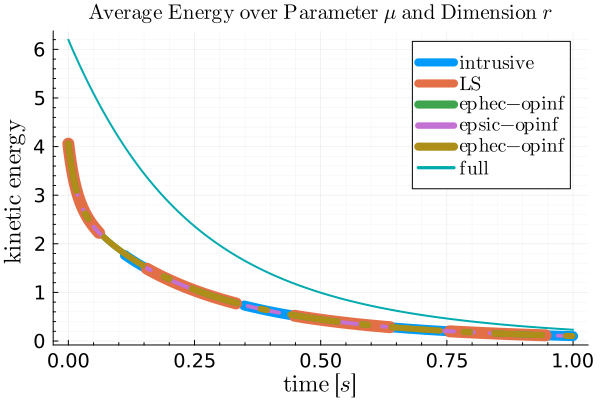

In [24]:
# Training data
mean_LS_En_tr = mean(Data["test2_En"][:LS])'
mean_int_En_tr = mean(Data["test2_En"][:int])'
mean_ephec_En_tr = mean(Data["test2_En"][:ephec])'
mean_epsic_En_tr = mean(Data["test2_En"][:epsic])'
mean_epp_En_tr = mean(Data["test2_En"][:epp])'
mean_fom_En_tr = mean(Data["test2_En"][:fom])

plot(burger.t, mean_int_En_tr, lw=10, ls=:dash, label=L"\mathrm{intrusive}")
plot!(burger.t, mean_LS_En_tr, lw=12, ls=:dash, label=L"\mathrm{LS}")
plot!(burger.t, mean_ephec_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epsic_En_tr, lw=4, ls=:dashdotdot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_epp_En_tr, lw=6, ls=:dashdot, label=L"\mathrm{ephec}\rm{-}\mathrm{opinf}")
plot!(burger.t, mean_fom_En_tr, lw=2, label=L"\mathrm{full}")
plot!(majorgrid=true, minorgrid=true, legend=:topright)
xlabel!(L"\mathrm{time}~[s]")
ylabel!(L"\mathrm{kinetic~energy~}")
title!(L"\mathrm{Average~Energy~over~Parameter}~\mu \mathrm{~and~Dimension~} r")
plot!(guidefontsize=16, tickfontsize=13,  legendfontsize=13)

## Plot Test 1 and Test 2 together

In [5]:
function errBnds(Y)
    N, M = size(Y)
    Ym = median(Y, dims=2)
    q1 = quantile.(eachrow(Y), fill(0.25, N))
    q3 = quantile.(eachrow(Y), fill(0.75, N))
    eps1 = Ym - q1
    eps2 = q3 - Ym
    return eps1, eps2
end;

In [43]:
# Test 1
mean_LS_state_err = mean(Data["test1_state_err"][:LS], dims=2)
mean_int_state_err = mean(Data["test1_state_err"][:int], dims=2)
mean_ephec_state_err = mean(Data["test1_state_err"][:ephec], dims=2)
# mean_epsic_state_err = mean(Data["test1_state_err"][:epsic], dims=2)
# mean_epp_state_err = mean(Data["test1_state_err"][:epp], dims=2)
# test1_q1, test1_q3 = errBnds(Data["test1_state_err"][:ephec])

p = plot(rmin:rmax, mean_int_state_err, c=:orange, marker=(:cross, 10), markerstrokewidth=2.5, label="Intrusive")
plot!(rmin:rmax, mean_LS_state_err, c=:crimson, marker=(:circle, 5), label="OpInf", markerstrokecolor=:crimson, lw=2)
plot!(rmin:rmax, mean_ephec_state_err, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), ls=:dash, lw=2, label="EP-OpInf")
# plot!(rmin:rmax, mean_epsic_state_err, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label=L"\mathrm{epsic}\rm{-}\mathrm{opinf}")
# plot!(rmin:rmax, mean_epp_state_err, c=:red, markerstrokecolor=:red, marker=(:star, 3), lw=1, ls=:dash, label=L"\mathrm{epp}\rm{-}\mathrm{opinf}")

# Test 2
mean_LS_state_err = mean(Data["test2_state_err"][:LS], dims=2)
mean_int_state_err = mean(Data["test2_state_err"][:int], dims=2)
mean_ephec_state_err = mean(Data["test2_state_err"][:ephec], dims=2)
# mean_epsic_state_err = mean(Data["test2_state_err"][:epsic], dims=2)
# mean_epp_state_err = mean(Data["test2_state_err"][:epp], dims=2)

# test2_q1, test2_q3 = errBnds(Data["test2_state_err"][:ephec])

plot!(rmin:rmax, mean_LS_state_err, c=:crimson, marker=(:circle, 5), label="", lw=2, markerstrokecolor=:crimson)
plot!(rmin:rmax, mean_int_state_err, c=:orange, marker=(:cross, 10), markerstrokewidth=2.5, label="")
plot!(rmin:rmax, mean_ephec_state_err, c=:blue, markerstrokecolor=:blue, marker=(:rect, 3), ls=:dash, lw=2, label="")
# plot!(rmin:rmax, mean_epsic_state_err, c=:purple, markerstrokecolor=:purple, marker=(:dtriangle, 5), ls=:dot, label="")
# plot!(rmin:rmax, mean_epp_state_err, c=:red, markerstrokecolor=:red, marker=(:star, 3), lw=1, ls=:dash, label="")

plot!(yscale=:log10, majorgrid=true, legend=:bottomleft)
# tmp = log10.(mean_int_state_err)
# yticks!([10.0^i for i in floor(minimum(tmp))-1:ceil(maximum(tmp))+1])
xticks!(rmin:rmax)
xlabel!("reduced model dimension " * L" r")
ylabel!("average relative state error")
title!("Test", fontsize=18)
ylims!(1e-4,2)
# yticks!([10.0^i for i in -4:1:0])
plot!(guidefontsize=16, tickfontsize=13, legendfontsize=13, titlefontsize=18, fontfamily="Computer Modern")
annotate!(rmax-3.5, 5e-4, text("(1) Interpolation", 13, :left, :bottom, :white, "Computer Modern"))
annotate!(rmax-3.0, 1.5e-1, text("(2) Extrapolation", 13, :left, :top, :white, "Computer Modern"))
plot!(background_color=:transparent, background_color_inside="#44546A", dpi=600)
savefig("figures/burgers_test_rse.png");